# Caroline Barte
# DSC 640 Weeks 9-10

## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
airportinfo = pd.read_csv('iata-icao.csv')
category = pd.read_csv('complaints-by-category.csv')
airport = pd.read_csv('complaints-by-airport.csv')
subcategory = pd.read_csv('complaints-by-subcategory.csv')

In [3]:
category.columns

Index(['pdf_report_date', 'airport', 'category', 'year_month', 'count',
       'clean_cat', 'clean_cat_status'],
      dtype='object')

In [4]:
airportinfo.columns

Index(['country_code', 'region_name', 'iata', 'icao', 'airport', 'latitude',
       'longitude'],
      dtype='object')

In [5]:
airport.columns

Index(['pdf_report_date', 'airport', 'year_month', 'count'], dtype='object')

In [6]:
subcategory.columns

Index(['pdf_report_date', 'airport', 'category', 'subcategory', 'year_month',
       'count', 'clean_cat', 'clean_subcat', 'clean_cat_status',
       'clean_subcat_status', 'is_category_prefix_removed'],
      dtype='object')

## Merging Datasets

In [7]:
df = airport.merge(category, on='airport', how='inner')

In [8]:
df

,pdf_report_date_x,airport,year_month_x,count_x,pdf_report_date_y,category,year_month_y,count_y,clean_cat,clean_cat_status
0,2019-02,ABE,2015-01,0,2019-02,Hazardous Materials Safety,2015-01,0,Hazardous Materials Safety,original
1,2019-02,ABE,2015-01,0,2019-02,Mishandling of Passenger Property,2015-01,0,Mishandling of Passenger Property,original
2,2019-02,ABE,2015-01,0,2019-02,Hazardous Materials Safety,2015-02,0,Hazardous Materials Safety,original
3,2019-02,ABE,2015-01,0,2019-02,Mishandling of Passenger Property,2015-02,0,Mishandling of Passenger Property,original
4,2019-02,ABE,2015-01,0,2019-02,Hazardous Materials Safety,2015-03,0,Hazardous Materials Safety,original
...,...,...,...,...,...,...,...,...,...,...
25682617,2024-02,NaN,2024-01,3316,2024-02,Request for Assistance,2024-01,1,Request for Assistance,original
25682618,2024-02,NaN,2024-01,3316,2024-02,SIDA (Security Identification Display Area),2024-01,0,SIDA (Security Identification Display Area),original
25682619,2024-02,NaN,2024-01,3316,2024-02,Screening,2024-01,66,Screening,original
25682620,2024-02,NaN,2024-01,3316,2024-02,TSA Contact Information,2024-01,1,TSA Contact Information,original


## 1: Heatmap

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
# Since the data has a lot of points, I'm sorting it by top 10 airports. 
top_airports = df['airport'].value_counts().nlargest(10).index
top_categories = df['clean_cat'].value_counts().nlargest(10).index

filtered_df = df[df['airport'].isin(top_airports) & df['clean_cat'].isin(top_categories)]

# Create a pivot table
heatmap_data = filtered_df.pivot_table(values='count_x', index='airport', columns='clean_cat', aggfunc='sum', fill_value=0)

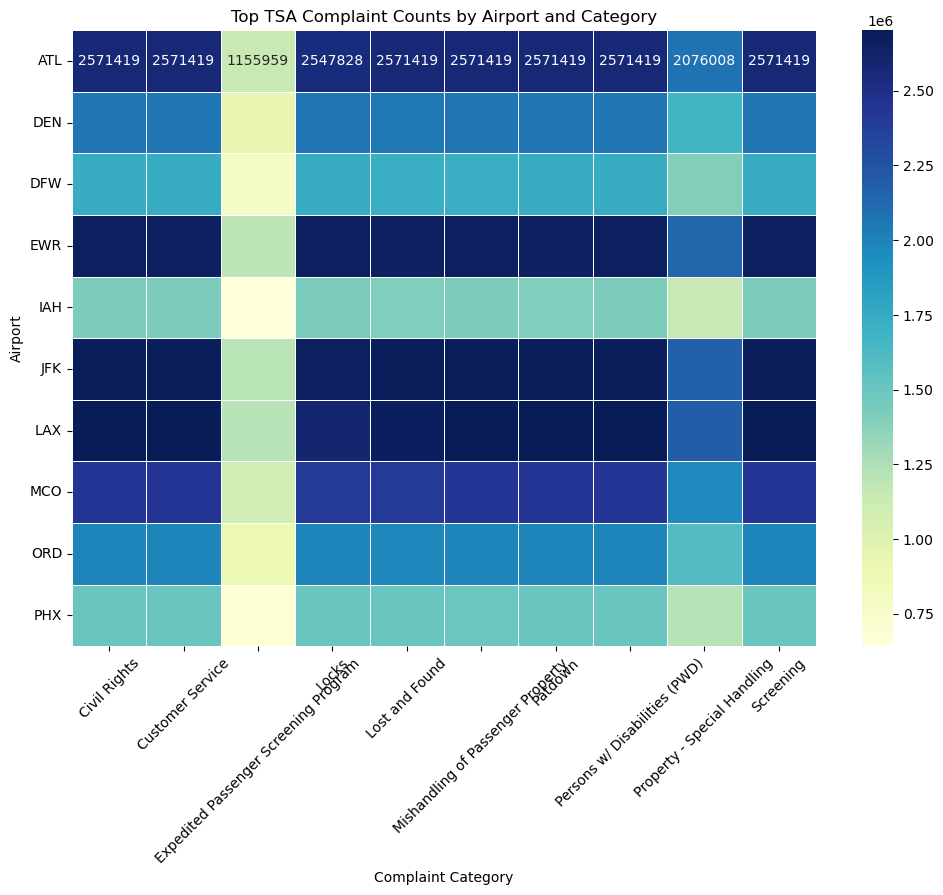

In [37]:
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt="d", linewidths=.5)
plt.title("Top TSA Complaint Counts by Airport and Category")
plt.xlabel("Complaint Category")
plt.ylabel("Airport")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## 2: BoxPlot

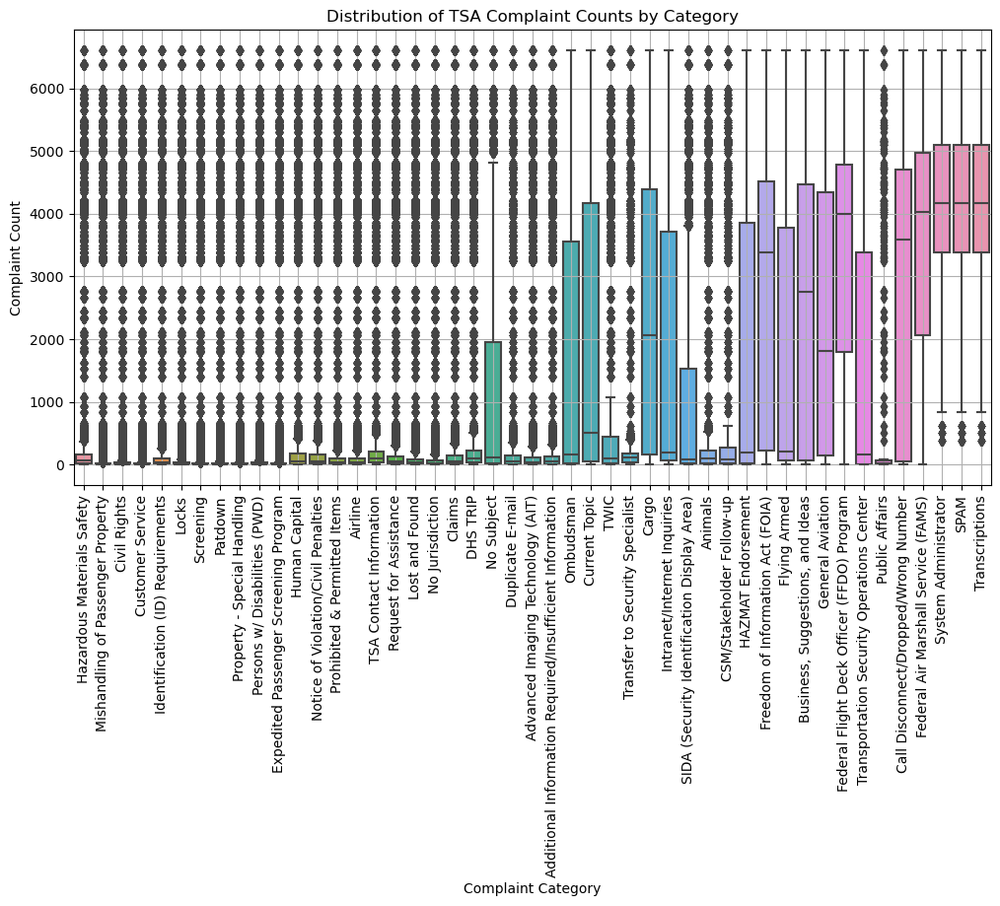

In [38]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='clean_cat', y='count_x')
plt.title('Distribution of TSA Complaint Counts by Category')
plt.xlabel('Complaint Category')
plt.ylabel('Complaint Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

## 3: Spatial Visual/Choropleth Map

In [39]:
import pandas as pd
import plotly.express as px
import geopandas as gpd
airportinfo.head(10)

,country_code,region_name,iata,icao,airport,latitude,longitude
0,AE,Abu Zaby,AAN,OMAL,Al Ain International Airport,24.2617,55.6092
1,AE,Abu Zaby,AUH,OMAA,Abu Dhabi International Airport,24.4330,54.6511
2,AE,Abu Zaby,AYM,NaN,Yas Island Seaplane Base,24.4670,54.6103
3,AE,Abu Zaby,AZI,OMAD,Al Bateen Executive Airport,24.4283,54.4581
4,AE,Abu Zaby,DHF,OMAM,Al Dhafra Air Base,24.2482,54.5477
5,AE,Abu Zaby,XSB,OMBY,Sir Bani Yas Airport,24.2836,52.5803
6,AE,Abu Zaby,ZDY,OMDL,Dalma Airport,24.5100,52.3352
7,AE,Al Fujayrah,FJR,OMFJ,Fujairah International Airport,25.1122,56.3240
8,AE,Ash Shariqah,SHJ,OMSJ,Sharjah International Airport,25.3286,55.5172
9,AE,Dubayy,DCG,NaN,Dubai Creek Seaplane Base,25.2422,55.3314


In [12]:
import folium
from folium.plugins import MarkerCluster

In [40]:
m = folium.Map(location=[20, 0], zoom_start=2)
marker_cluster = MarkerCluster().add_to(m)

In [41]:
for idx, row in airportinfo.iterrows():
    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=f"{row['airport']}<br>Complaints: {row['country_code']}",
        icon=folium.Icon(color='blue')
    ).add_to(marker_cluster)

In [42]:
m

## 4: Bar Chart

In [43]:
# Grouping by total complaints 
airport_complaints = df.groupby('airport')['count_x'].sum().reset_index()

# Sort airports by complaint count
top_airports = airport_complaints.sort_values(by='count_x', ascending=False).head(10)

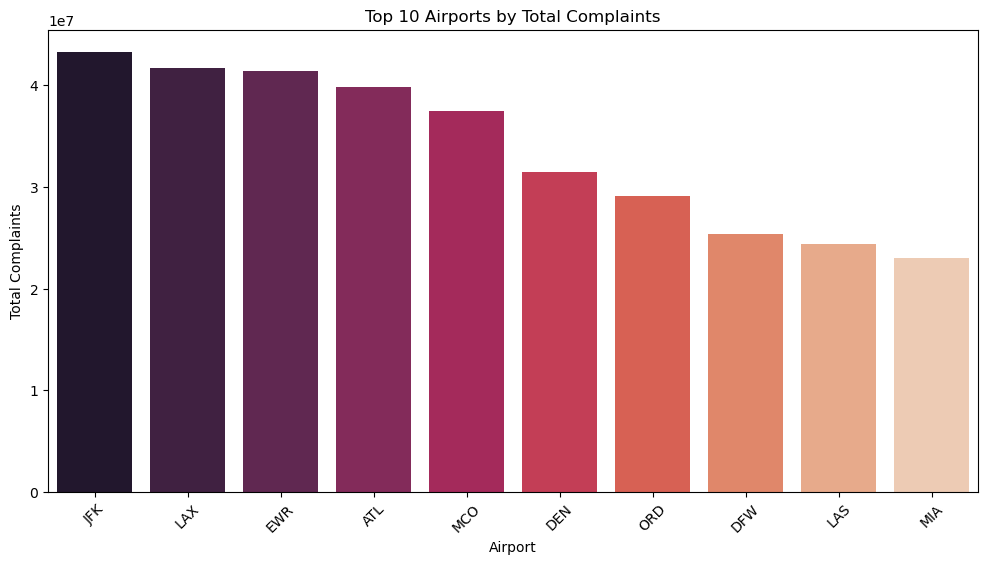

In [44]:
plt.figure(figsize=(12, 6))
sns.barplot(data=top_airports, x='airport', y='count_x', palette='rocket')
plt.title('Top 10 Airports by Total Complaints')
plt.xlabel('Airport')
plt.ylabel('Total Complaints')
plt.xticks(rotation=45)
plt.show()

## 5: Time Series

In [45]:
# Convert 'year_month_x' and 'year_month_y' to datetime
df['year_month_x'] = pd.to_datetime(df['year_month_x'])
df['year_month_y'] = pd.to_datetime(df['year_month_y'])

# Sort the data by month
time_series = df.groupby('year_month_x')['count_x'].sum().reset_index()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


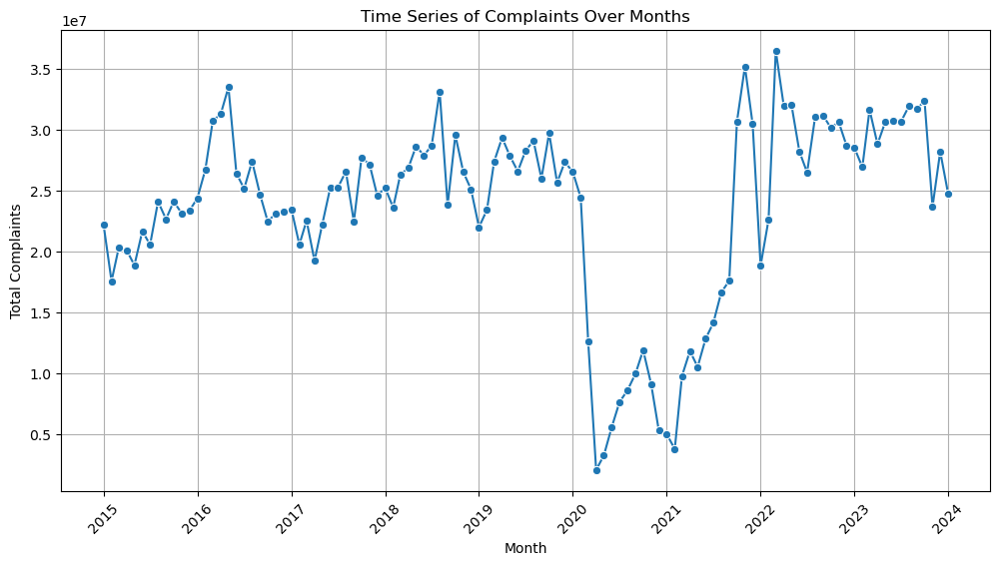

In [46]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=time_series, x='year_month_x', y='count_x', marker='o')
plt.title('Time Series of Complaints Over Months')
plt.xlabel('Month')
plt.ylabel('Total Complaints')
plt.xticks(rotation=45)
plt.grid()
plt.show()

## 6: Bar Chart

In [47]:
category_complaints = df.groupby('category')['count_x'].sum().reset_index()
category_complaints = category_complaints.sort_values(by='count_x', ascending=False)

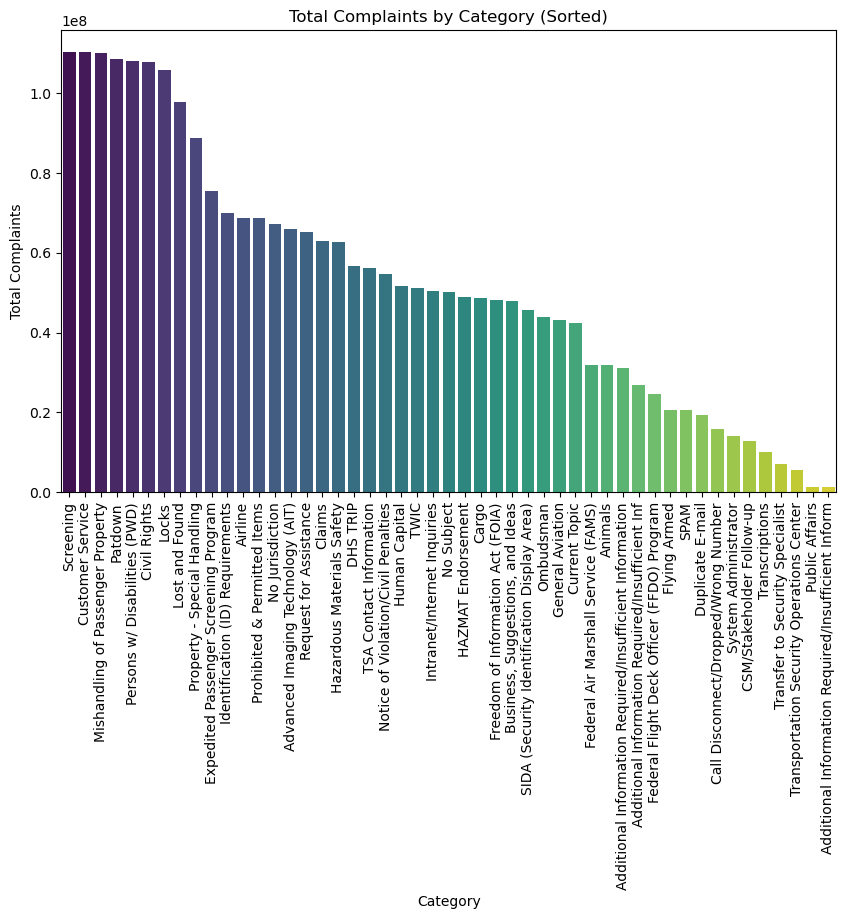

In [48]:
plt.figure(figsize=(10, 6))
sns.barplot(data=category_complaints, x='category', y='count_x', palette='viridis')
plt.title('Total Complaints by Category (Sorted)')
plt.xlabel('Category')
plt.ylabel('Total Complaints')
plt.xticks(rotation=90)
plt.show()